<a href="https://colab.research.google.com/github/estebanurrutia1/Analitica/blob/main/Tarea13Mayo14.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [112]:
pip install opencv-python

In [113]:
pip install opencv-contrib-python

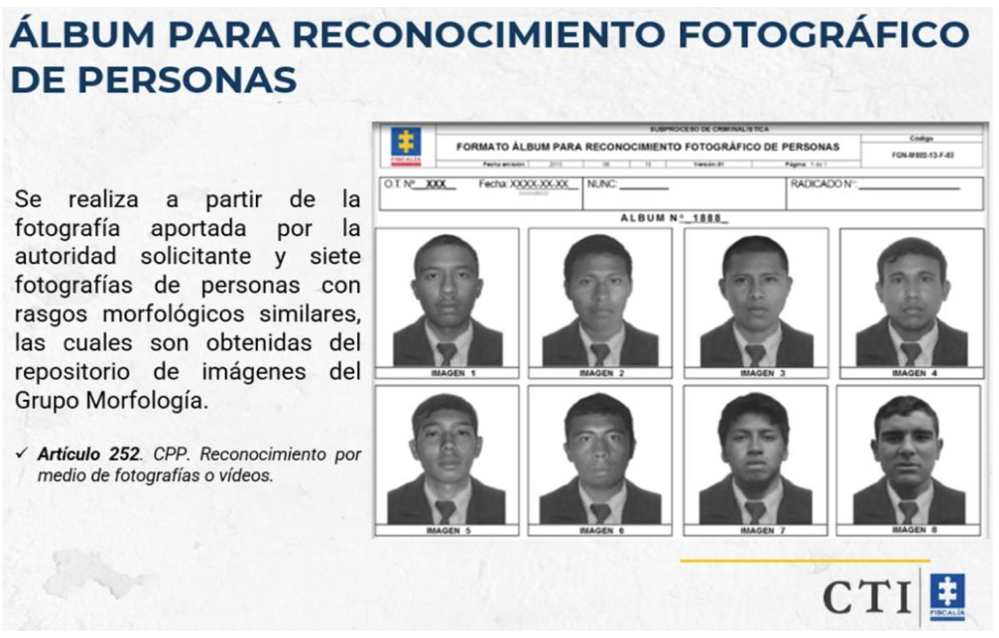

In [114]:
import cv2


# Leer una imagen desde un archivo
imagen = cv2.imread('clauidia.png')

# Mostrar la imagen en una ventana
cv2_imshow(imagen)


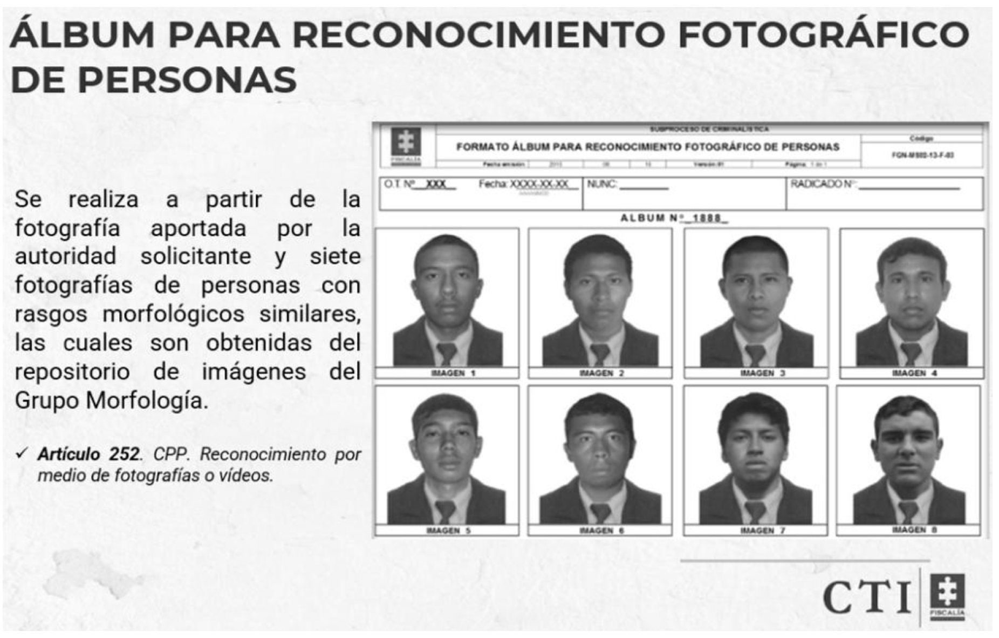

In [115]:
# Convertir la imagen a escala de grises

imagen_gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

# Mostrar la imagen en escala de grises
cv2_imshow(imagen_gris)

In [116]:
# Guardar la imagen en escala de grises

cv2.imwrite('imagen_gris.jpg', imagen_gris)

True

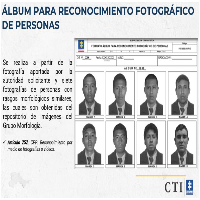

In [117]:
# Redimensionar la imagen a 200x200 píxeles

imagen_redimensionada = cv2.resize(imagen, (200, 200))

# Mostrar la imagen redimensionada

cv2_imshow(imagen_redimensionada)

In [118]:
# Rotar imagenes

# Obtener las dimensiones de la imagen
(h, w) = imagen.shape[:2]
centro = (w // 2, h // 2)


In [119]:
# Definir la matriz de rotación para rotar la imagen 45 grados

M = cv2.getRotationMatrix2D(centro, 45, 1.0)
imagen_rotada = cv2.warpAffine(imagen, M, (w, h))

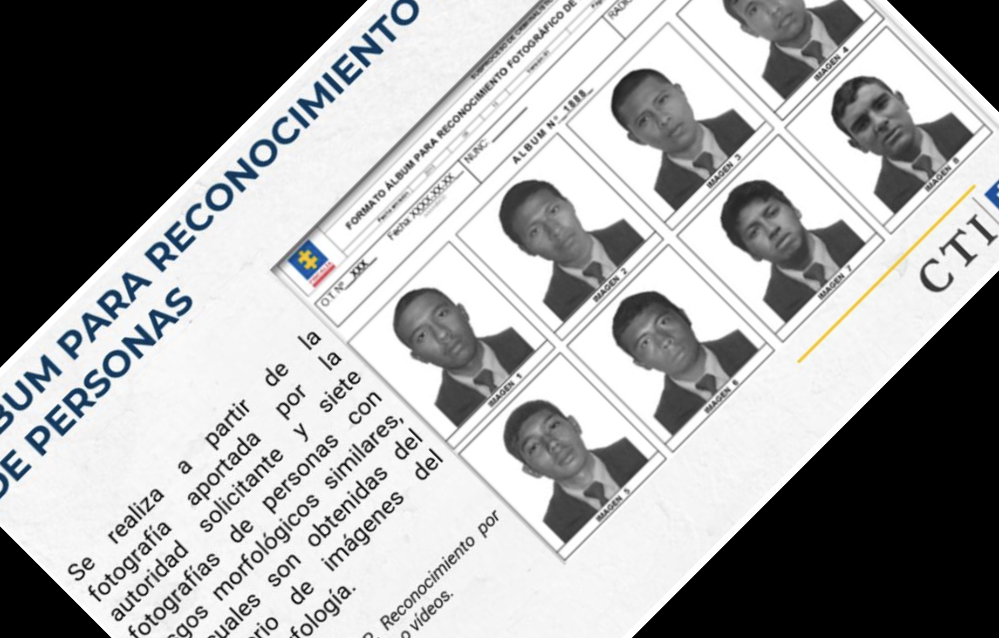

In [120]:
# Mostrar la imagen rotada

cv2_imshow(imagen_rotada)

In [121]:
# Recortar la región de interés (ROI)
roi = imagen[50:200, 150:350]

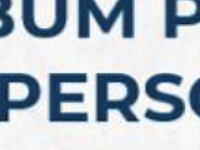

In [122]:
# Mostrar la imagen recortada

cv2_imshow(roi)

In [174]:
# Aplicar un filtro Gaussiano para suavizar la imagen

imagen_suavizada = cv2.GaussianBlur(imagen, (15, 15), 0)

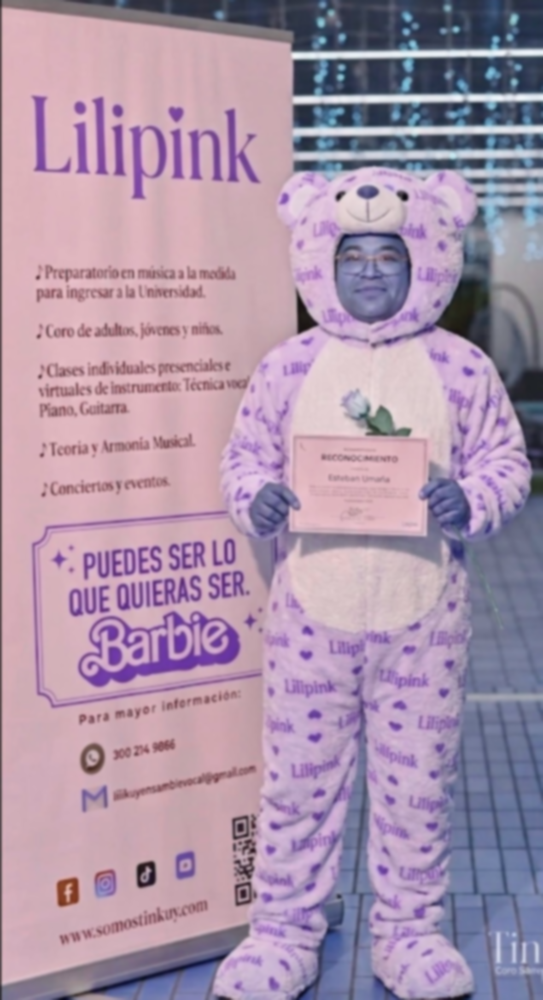

In [176]:
# Mostrar la imagen suavizada
cv2_imshow(imagen_suavizada)

In [125]:
# Aplicar el algoritmo Canny para detectar bordes

bordes = cv2.Canny(imagen_gris, 100, 200)

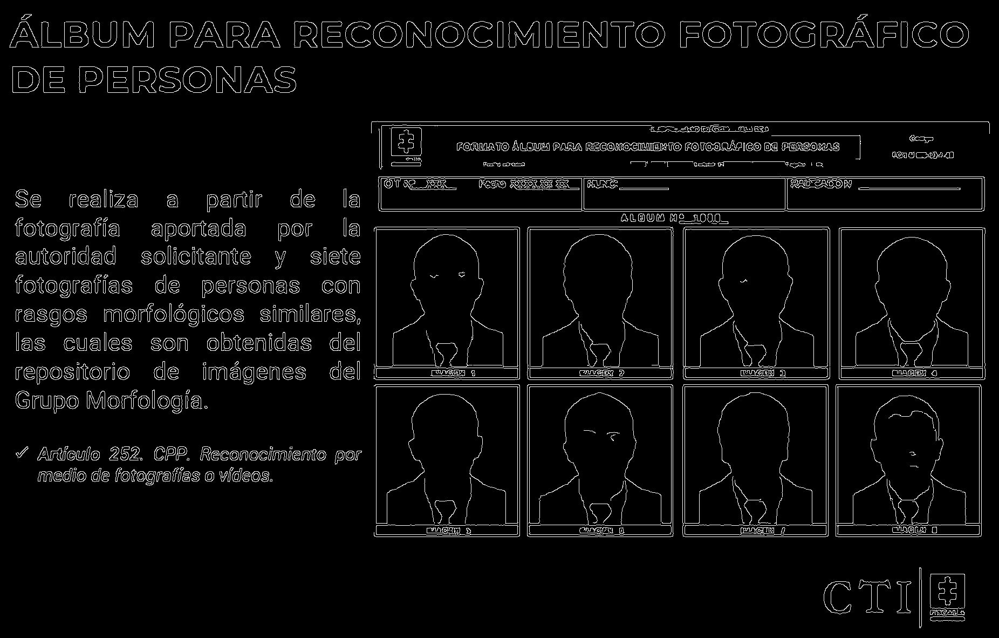

In [126]:
# Mostrar los bordes detectados
cv2_imshow(bordes)

In [127]:
# Cargar el clasificador de caras preentrenado
cascade_cara = cv2.CascadeClassifier(cv2.data.haarcascades +
'haarcascade_frontalface_default.xml')

In [128]:
# Detectar caras en la imagen
caras = cascade_cara.detectMultiScale(imagen_gris,
scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

In [129]:
# Dibujar rectángulos alrededor de las caras detectadas
for (x, y, w, h) in caras:
    cv2.rectangle(imagen, (x, y), (x + w, y + h), (255, 0, 0),2)

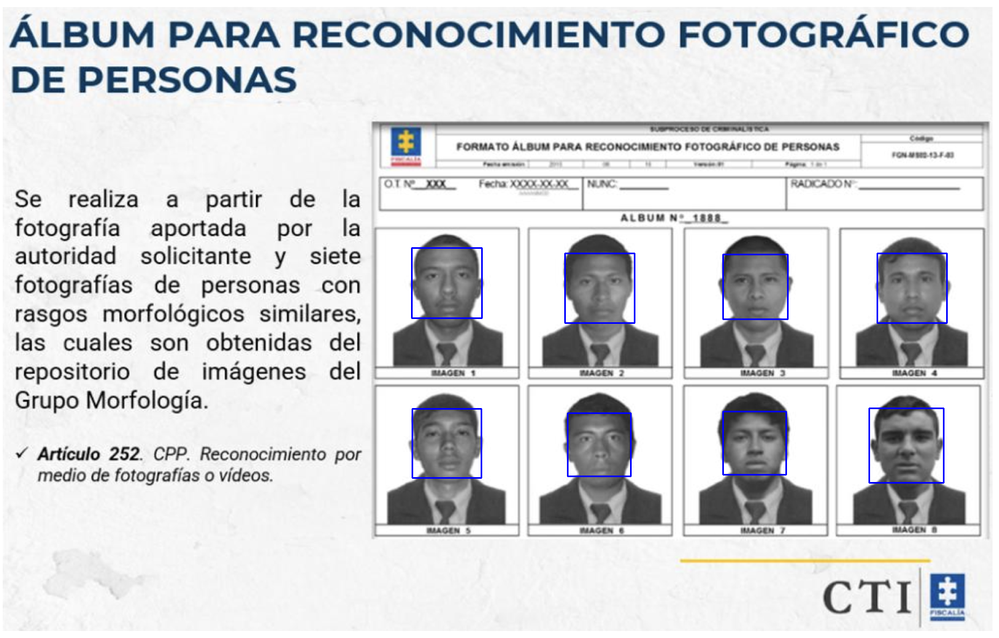

In [130]:
# Mostrar la imagen con las caras detectadas
cv2_imshow(imagen)

In [131]:
# Scikit-Image

In [132]:
pip install scikit-image

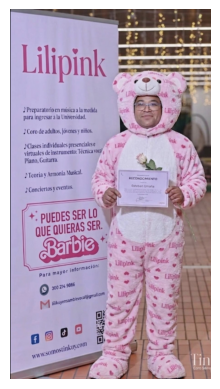

In [152]:
from skimage import io
import matplotlib.pyplot as plt
# Leer una imagen desde un archivo
imagen = io.imread('esteban.jpg')
# Mostrar la imagen usando Matplotlib
plt.imshow(imagen)
plt.axis('off') # Ocultar los ejes
plt.show()

In [153]:
from skimage.color import rgb2gray

# Convertir la imagen a escala de grises
imagen_gris = rgb2gray(imagen)

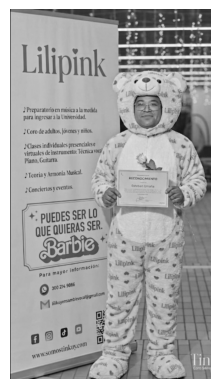

In [154]:
# Mostrar la imagen en escala de grises
plt.imshow(imagen_gris, cmap='gray')
plt.axis('off')
plt.show()

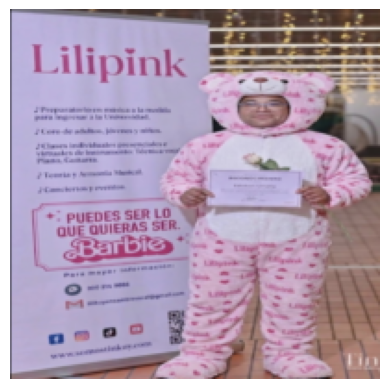

In [155]:
from skimage.transform import resize
# Redimensionar la imagen a 200x200 píxeles
imagen_redimensionada = resize(imagen, (200, 200))
# Mostrar la imagen redimensionada
plt.imshow(imagen_redimensionada)
plt.axis('off')
plt.show()


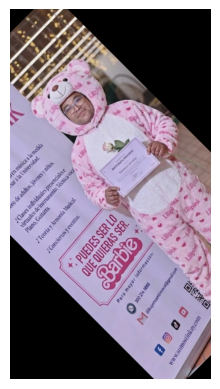

In [156]:
from skimage.transform import rotate
# Rotar la imagen 45 grados
imagen_rotada = rotate(imagen, 45)
# Mostrar la imagen rotada
plt.imshow(imagen_rotada)
plt.axis('off')
plt.show()

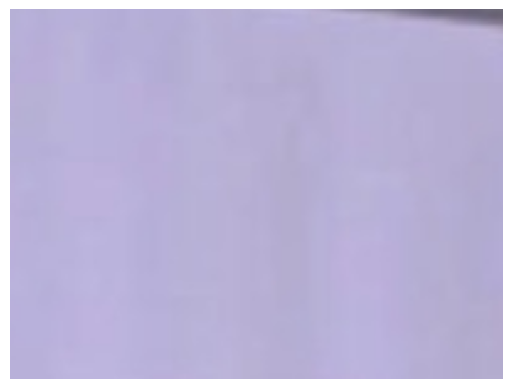

In [157]:
# Recortar la región de interés (ROI)
roi = imagen[50:200, 150:350]
# Mostrar la imagen recortada
plt.imshow(roi)
plt.axis('off')
plt.show()

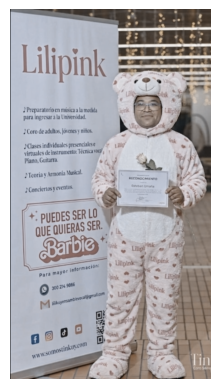

In [158]:
from skimage.filters import gaussian
# Aplicar un filtro Gaussiano para suavizar la imagen
imagen_suavizada = gaussian(imagen, sigma=1)
# Mostrar la imagen suavizada
plt.imshow(imagen_suavizada)
plt.axis('off')
plt.show()

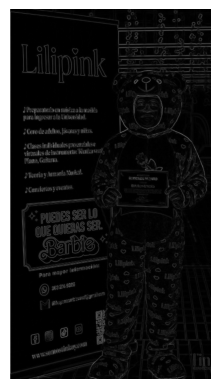

In [159]:
from skimage.filters import sobel
# Aplicar el filtro Sobel para detectar bordes
bordes = sobel(imagen_gris)
# Mostrar los bordes detectados
plt.imshow(bordes, cmap='gray')
plt.axis('off')
plt.show()

In [141]:
# Segmentación de Imágenes

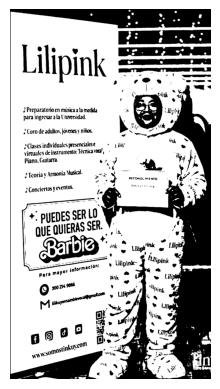

In [160]:
from skimage.filters import threshold_otsu
# Calcular el umbral global usando el método de Otsu
umbral = threshold_otsu(imagen_gris)
imagen_umbralizada = imagen_gris > umbral
# Mostrar la imagen umbralizada
plt.imshow(imagen_umbralizada, cmap='gray')
plt.axis('off')
plt.show()

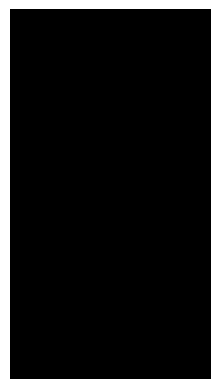

In [161]:
from skimage.filters import threshold_local
# Calcular el umbral local
umbral_local = threshold_local(imagen_gris, block_size=35,
offset=10)
imagen_umbralizada_local = imagen_gris > umbral_local
# Mostrar la imagen umbralizada localmente
plt.imshow(imagen_umbralizada_local, cmap='gray')
plt.axis('off')
plt.show()

In [162]:
from skimage import img_as_float
from sklearn.cluster import KMeans
# Convertir la imagen a un arreglo de 2D
imagen_flat = img_as_float(imagen).reshape((-1, 3))

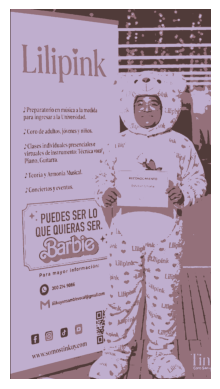

In [163]:
# Aplicar K-means clustering
kmeans = KMeans(n_clusters=3, random_state=0).fit(imagen_flat)
segmented_image = kmeans.cluster_centers_[kmeans.labels_]
segmented_image = segmented_image.reshape(imagen.shape)
# Mostrar la imagen segmentada
plt.imshow(segmented_image)
plt.axis('off')
plt.show()

In [146]:
# Análisis de Características

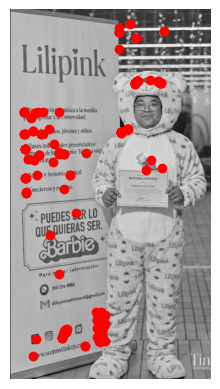

In [164]:
# Crear un objeto ORB

from skimage.feature import ORB
orb = ORB(n_keypoints=200)
# Detectar puntos clave y descriptores
orb.detect_and_extract(imagen_gris)
keypoints = orb.keypoints
# Mostrar los puntos clave detectados
fig, ax = plt.subplots()
ax.imshow(imagen_gris, cmap='gray')
ax.plot(keypoints[:, 1], keypoints[:, 0], 'ro')
plt.axis('off')
plt.show()

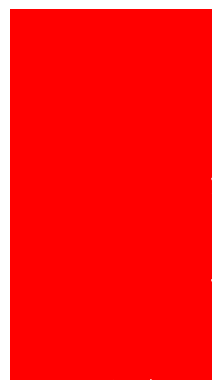

In [165]:
# ORB

from skimage.feature import corner_harris, corner_peaks
# Detectar esquinas usando el algoritmo Harris
esquinas = corner_peaks(corner_harris(imagen_gris),
min_distance=5)
# Mostrar las esquinas detectadas
fig, ax = plt.subplots()
ax.imshow(imagen_gris, cmap='gray')
ax.plot(esquinas[:, 1], esquinas[:, 0], 'ro')
plt.axis('off')
plt.show()

In [166]:
# TensorFlow y Keras

In [167]:
pip install tensorflow

In [168]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten

# Crear un modelo secuencial
model = Sequential()
# Añadir una capa convolucional
model.add(Conv2D(32, (3, 3), activation='relu',
input_shape=(64, 64, 3)))
# Añadir una capa de max-pooling
model.add(MaxPooling2D(pool_size=(2, 2)))
# Aplanar la salida de la capa convolucional
model.add(Flatten())
# Añadir una capa densa
model.add(Dense(64, activation='relu'))
# Añadir la capa de salida
model.add(Dense(10, activation='softmax'))
# Compilar el modelo
model.compile(optimizer='adam',
loss='sparse_categorical_crossentropy',
metrics=['accuracy'])
# Mostrar el resumen del modelo
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 62, 62, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 31, 31, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 30752)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │     1,968,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,969,738 (7.51 MB)

 Trainable params: 1,969,738 (7.51 MB)

 Non-trainable params: 0 (0.00 B)